In [1]:
from PIL import Image
import cv2
from matplotlib import pyplot as plt

## 00. Open Images

In [2]:
file_path = 'data/page_01.jpg'
img = cv2.imread(file_path)

In [3]:
def display(im_path):
    #https://stackoverflow.com/questions/28816046/displaying-different-images-with-actual-size-in-matplotlib-subplot
    dpi = 80
    im_data = plt.imread(im_path)
    try:
        height, width, depth = im_data.shape
    except:
        height, width = im_data.shape

    # What size does the figure need to be in inches to fit the image?
    figsize = width/ float(dpi), height/float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image
    ax.imshow(im_data, cmap='gray')

    plt.show()

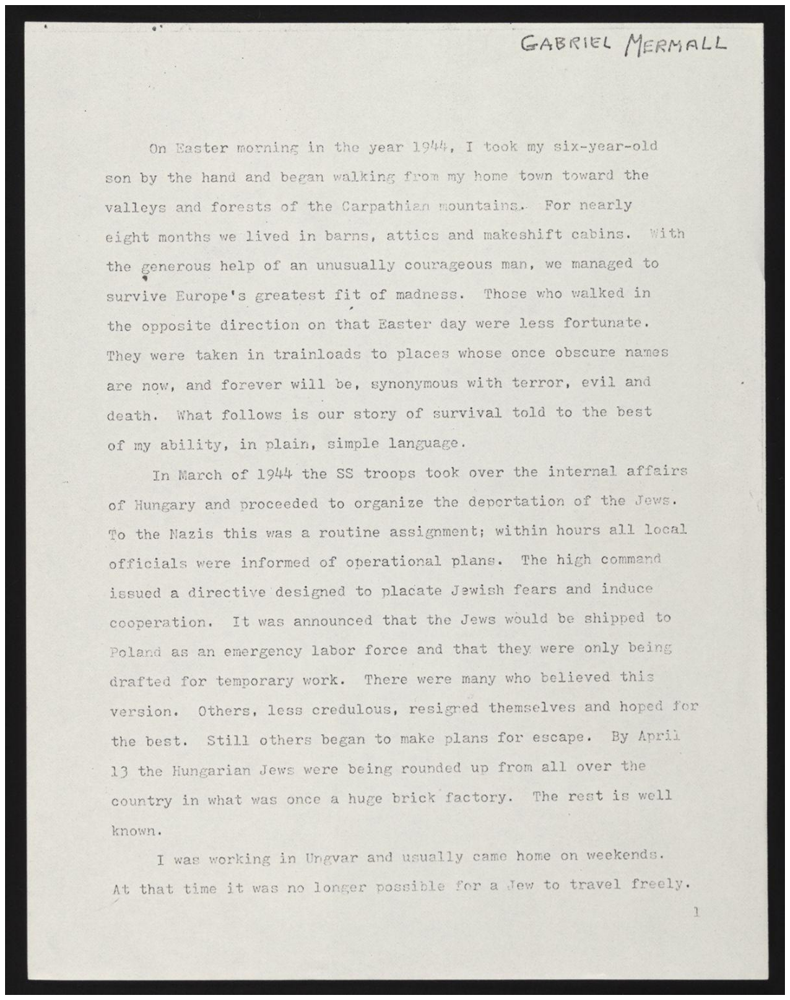

In [4]:
display(file_path)

## 01. Inverted Images

In [5]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite('temp/inverted_page_01.jpg',inverted_image)

True

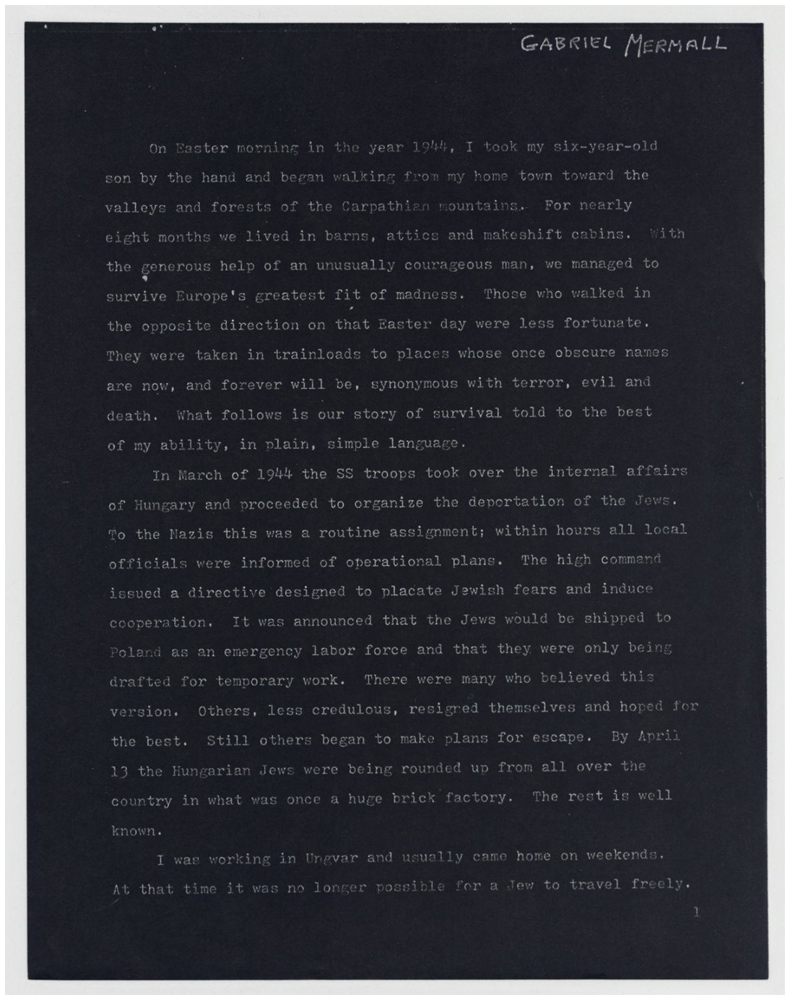

In [6]:
display('temp/inverted_page_01.jpg')

## 02. Rescaling

## 03. Binarization

In [7]:
def grayscale(image):
    '''Return Gray Scale Image'''
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [8]:
gray_image = grayscale(img)
cv2.imwrite('temp/grayscale_page_01.jpg', gray_image)

True

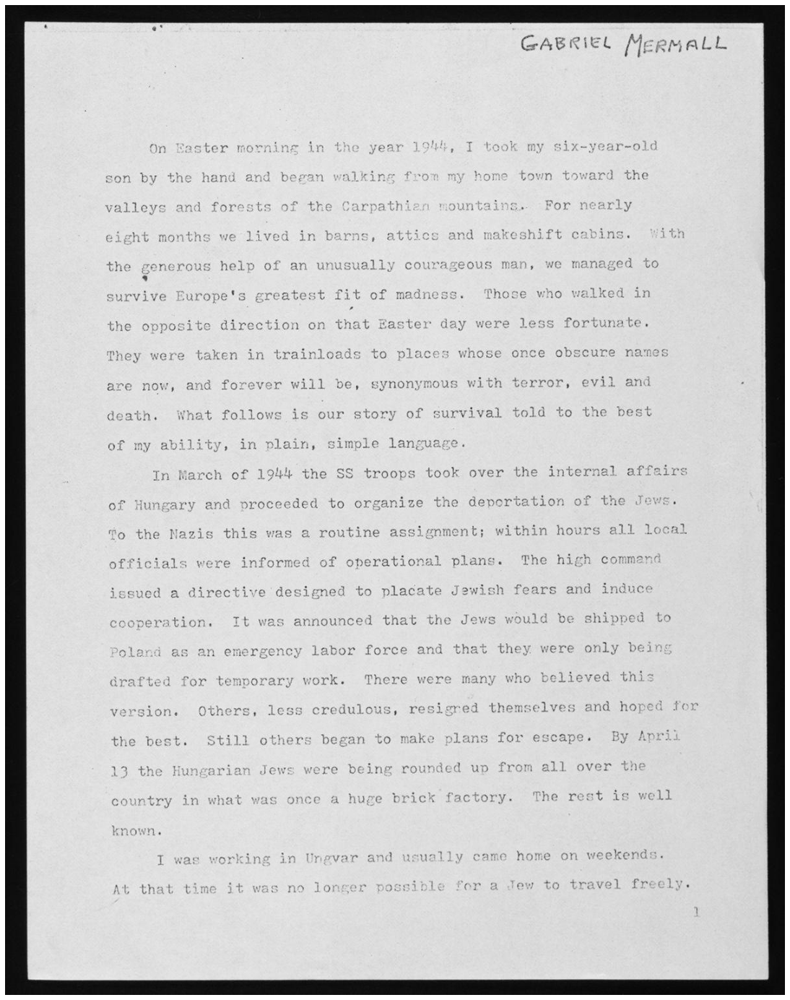

In [9]:
display('temp/grayscale_page_01.jpg')

In [10]:
# for thresh and maxval often start with those number 1st
thresh, im_bw = cv2.threshold(gray_image, 210, 230, cv2.THRESH_BINARY)
cv2.imwrite('temp/bw_page_01.jpg',im_bw)

True

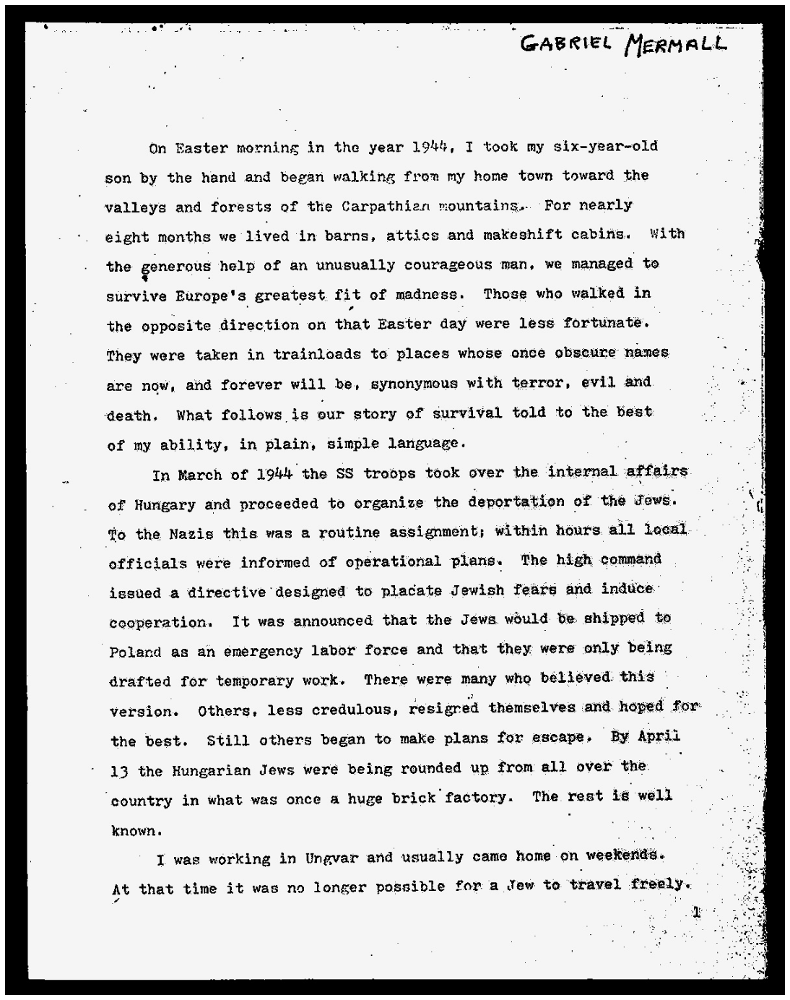

In [11]:
display('temp/bw_page_01.jpg')

## 04. Noise Removal

In [12]:
import numpy as np

def noise_removal(image):
    kernel = np.ones((1,1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1,1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)
    

In [13]:
no_noise = noise_removal(im_bw)
cv2.imwrite('temp/no_noise.jpg', no_noise)

True

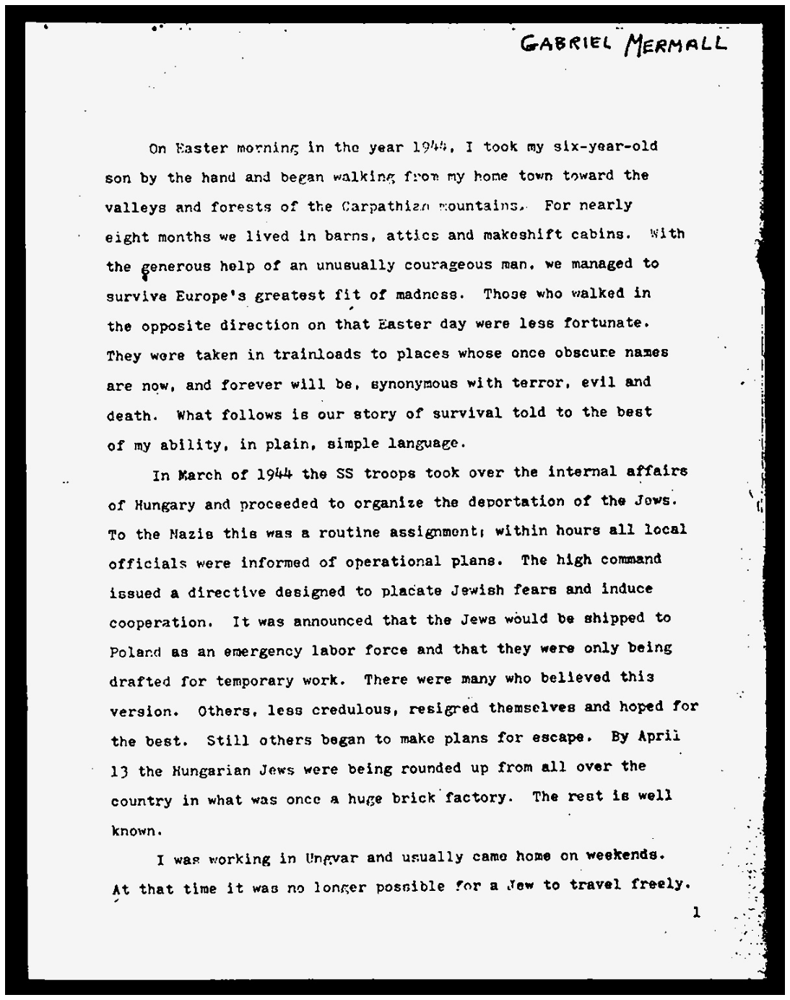

In [14]:
display('temp/no_noise.jpg')

## 05. Dilation and Erosion

In [15]:
def thin_font(image):
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return(image)

In [16]:
eroded_image = thin_font(no_noise)
cv2.imwrite('temp/erded_image.jpg', eroded_image)

True

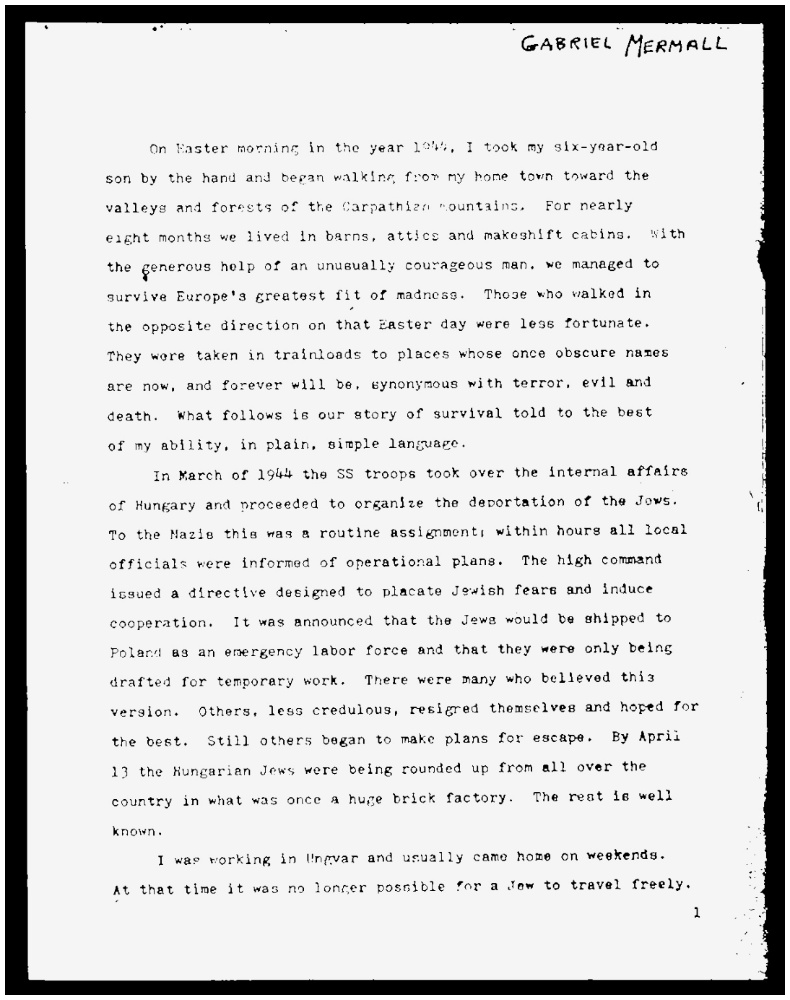

In [17]:
display('temp/erded_image.jpg')

In [18]:
def thick_font(image):
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return(image)

In [19]:
dilated_image = thick_font(no_noise)
cv2.imwrite('temp/dilated_image.jpg', dilated_image)

True

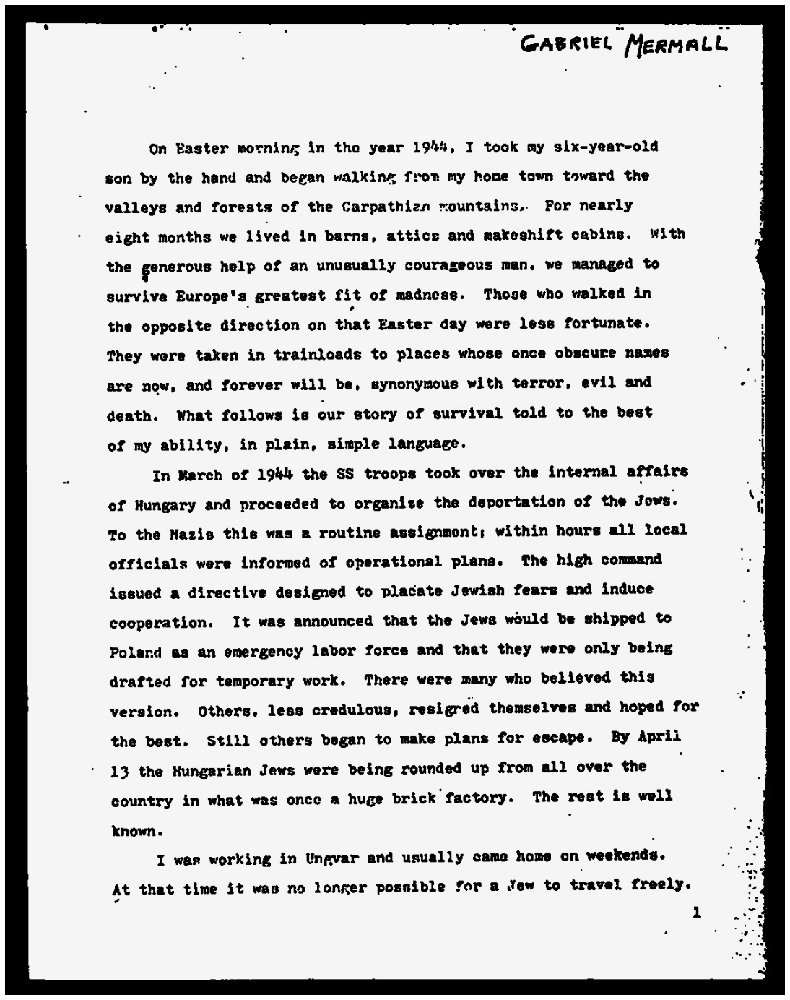

In [20]:
display('temp/dilated_image.jpg')

## 06. Rotation / Deskewing

In [22]:
# https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
def getSkewAngle(cvImage) -> float:
    # Prep image, copy,convert to gray scale, blur and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to seperate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30,5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate,cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key= cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage, (x,y), (x+w,y+h), (0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print(len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite('temp/boxes.jpg', newImage)
    # Determine the angle, Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle

# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h,w) = newImage.shape[:2]
    center = (w//2, h//2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags= cv2.INTER_CUBIC, borderMode= cv2.BORDER_REPLICATE)
    return newImage

def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [23]:
new = cv2.imread('data\page_01_rotated.JPG')
fixed = deskew(new)
cv2.imwrite('temp/rotated_fixed.jpg', fixed)

28


True

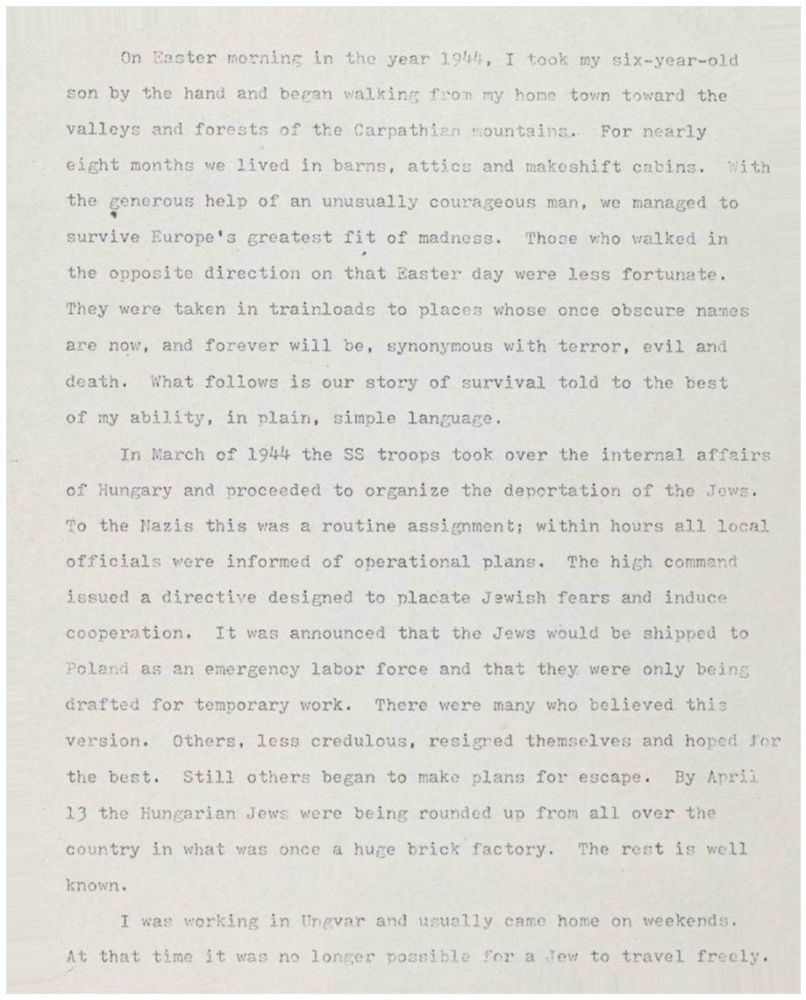

In [24]:
display('temp/rotated_fixed.jpg')

## 07. Removing Borders

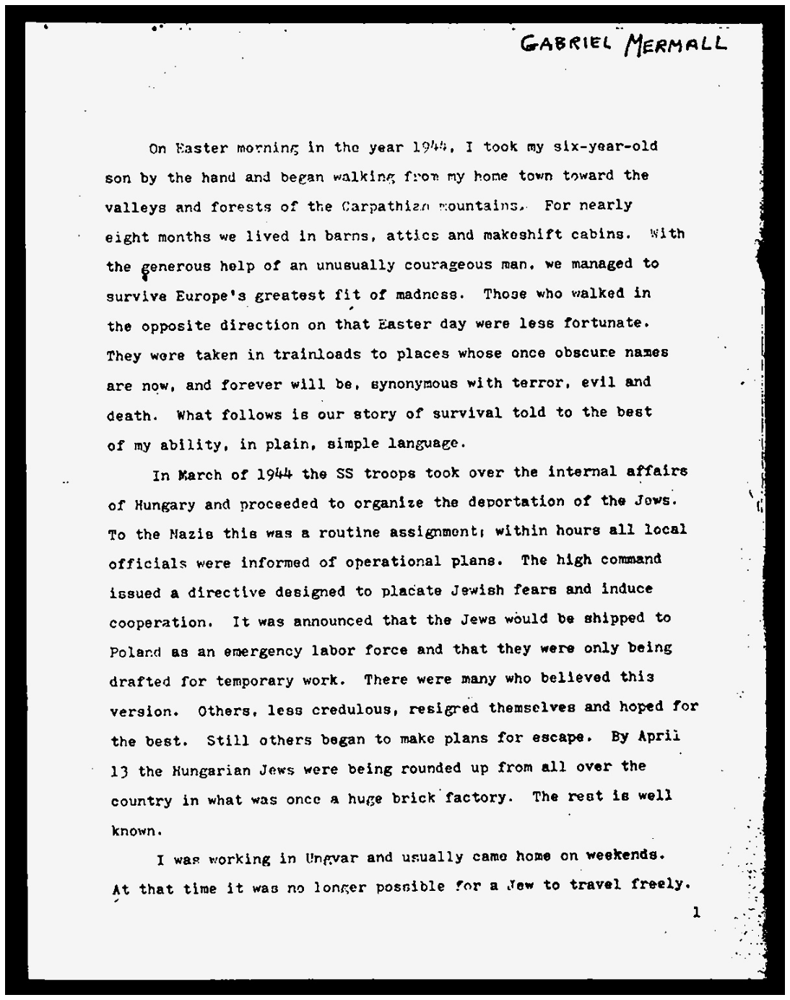

In [25]:
display('temp/no_noise.jpg')

In [28]:
def remove_borders(image):
    contours, heirarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntSorted = sorted(contours, key = lambda x:cv2.contourArea(x))
    cnt = cntSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return crop

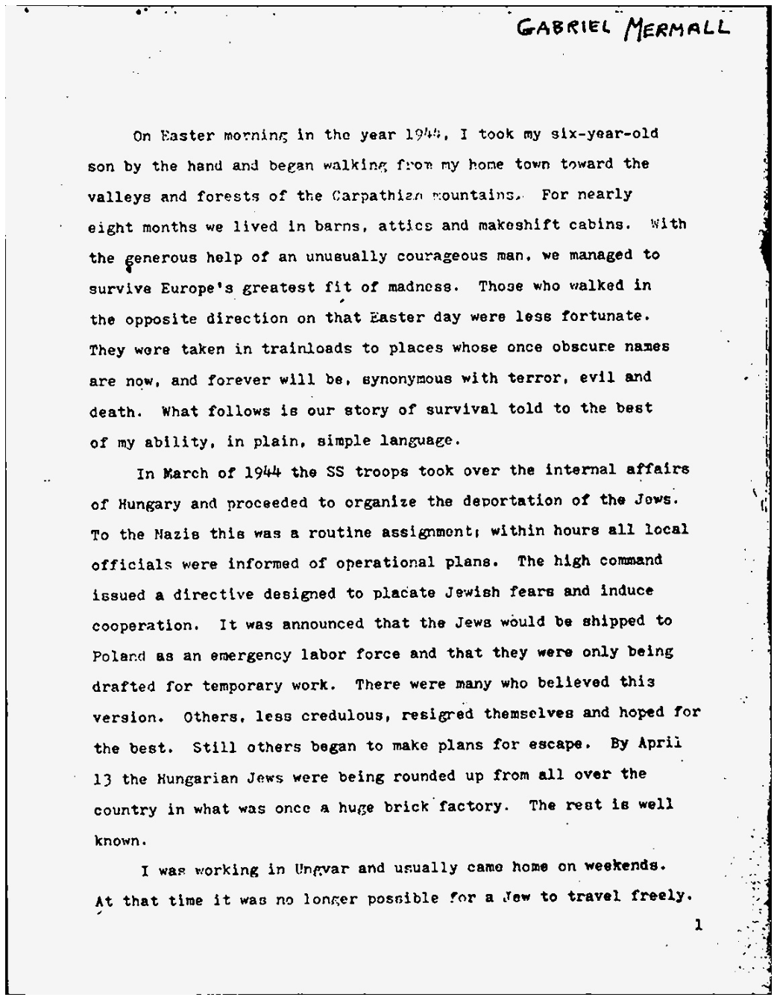

In [30]:
no_borders = remove_borders(no_noise)
cv2.imwrite("temp/no_borders.jpg", no_borders)
display("temp/no_borders.jpg")

## 08. Missing Borders

In [32]:
color = [255,255,255]
top, bottom, left, right = [150]*4

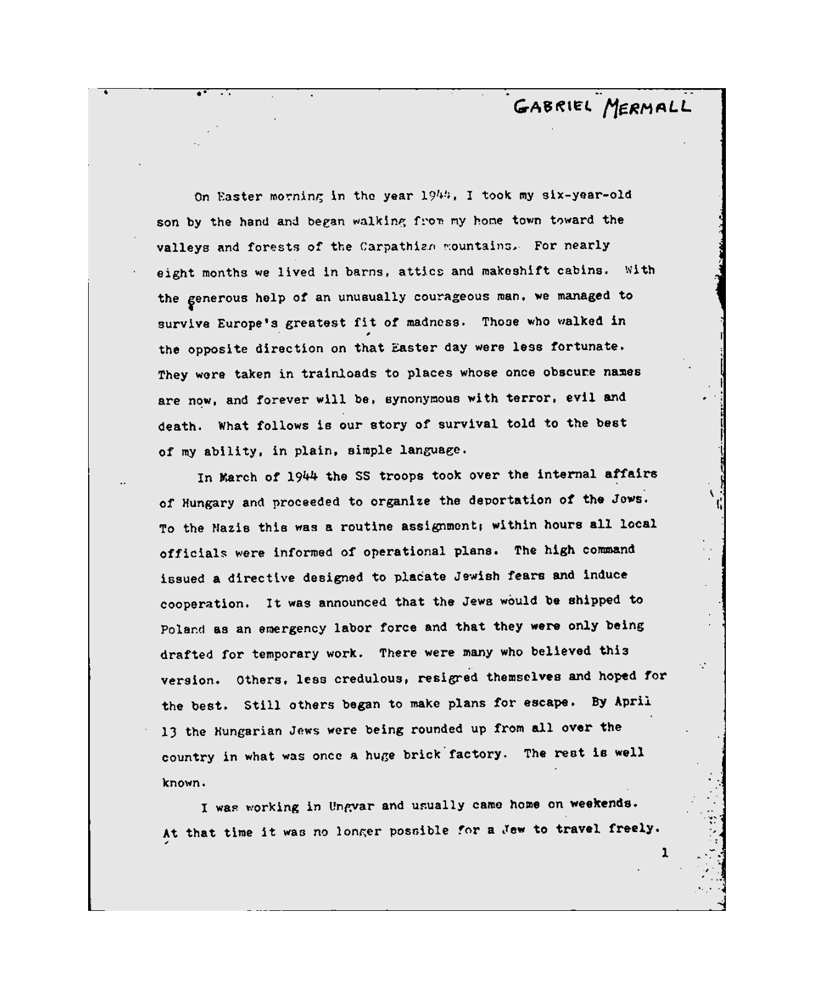

In [33]:
image_with_border = cv2.copyMakeBorder(no_borders, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite('temp/image_with_border.jpg', image_with_border)
display('temp/image_with_border.jpg')

## 09. Transperancy / Alpha Channel